In [1]:
import os
import seaborn as sns
import pandas as pd
import numpy as np
from poseidon.io.offline import load_raw_data
from poseidon.signal.lofar import lofar, tpsw
from poseidon.signal.utils import resample

In [2]:
dataset = '24classes'
datapath = os.path.join('..', '..', 'data', 'raw', 'submarine', dataset)

In [3]:
sonar_dict = load_raw_data(datapath)

In [4]:
import matplotlib.pyplot as plt

def plot_lofargram(Sxx, freq, time, ax=None, xticks=8, yticks=10,figsize=(10, 10), savepath=None):
    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = plt.gca()

    df = pd.DataFrame(Sxx, columns=freq, index=time)
    ax = sns.heatmap(df, xticklabels=10, yticklabels=20, cmap='jet', ax=ax)
    
    ticks = ax.get_xticks()
    ticklbls = ax.get_xticklabels()
    count = len(ticks)
    ticks = ticks[::(count//xticks)]
    ticklbls = ticklbls[::(count//xticks)]
    
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticklbls)
    
    ticks = ax.get_yticks()
    ticklbls = ax.get_yticklabels()
    count = len(ticks)
    ticks = ticks[::(count//yticks)]
    ticklbls = ticklbls[::(count//xticks)]
    
    ax.set_yticks(ticks)
    ax.set_yticklabels(ticklbls)


    if savepath is not None:
        fig.savefig(savepath, bbox_inches='tight')
#     plt.close(fig)

In [5]:
import re

Shape                          
Run             A        B        C       D
Class                                      
Class_1   3286602        0        0       0
Class_10  3368960  2793472        0       0
Class_11  2682880  3086037        0       0
Class_12  3269549        0        0       0
Class_13  2375680  2848768  2326528       0
Class_14  2680832  2994176        0       0
Class_15  1323000  1323000        0       0
Class_16  1976320  5038080        0       0
Class_17  2091008  3467264        0       0
Class_18  3700736        0        0       0
Class_19  3188736  2441216        0       0
Class_2   3110320        0        0       0
Class_20  3104768        0        0       0
Class_21  2236416  3182592        0       0
Class_22  3115008  2656250        0       0
Class_23  2914304  2410496  2236416       0
Class_24  1524103  1507840  3550157       0
Class_3   3289449        0        0       0
Class_4   3280103        0        0       0
Class_5   1140907  1275073   966456  637873
Class_6   2287616        0        0       0
Class_7   3569055  2909951        0       0
Class_8   2998272  3041280        0       0
Class_9   5996812        0        0       0

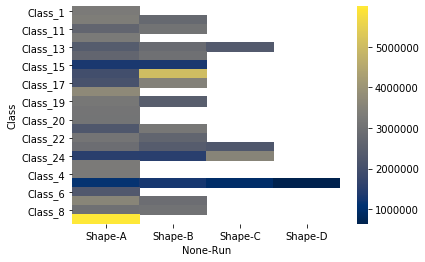

In [6]:
shape_df = (pd.DataFrame({(key, key_i):[key, key_i, runs.signal.shape[0]]
                for key, classes in sonar_dict.items()
                for key_i, runs in classes.items()})
 .transpose()
 .reset_index()
 .drop(['level_0', 'level_1'], axis=1))

shape_df.columns = ['Class', 'Run', 'Shape']

shape_df['Run'] = shape_df['Run'].apply(lambda x: re.sub(r'class[0-9]+_dataset[0-9]+', '', x.replace('.wav', '').replace('.WAV', '')))
shape_df = shape_df.replace({'Run': {'': 'A'}})

proc_df = shape_df.set_index(['Class', 'Run']).unstack('Run').fillna(0)
sns.heatmap(data=proc_df, mask=proc_df == 0, vmin=proc_df[proc_df != 0].min().min(),cmap='cividis')
shape_df.set_index(['Class', 'Run']).unstack('Run').fillna(0)

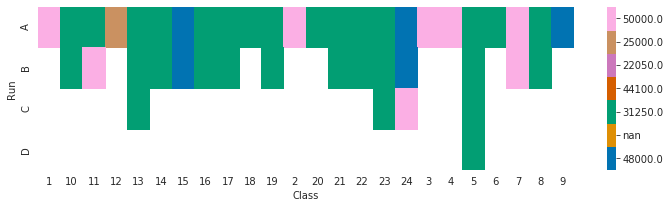

In [7]:
sns.set_style('whitegrid')
plt.figure(figsize=(12,3))

shape_df = (pd.DataFrame({(key, key_i):[key, key_i, runs.fs]
                for key, classes in sonar_dict.items()
                for key_i, runs in classes.items()})
 .transpose()
 .reset_index()
 .drop(['level_0', 'level_1'], axis=1))

shape_df.columns = ['Class', 'Run', 'Shape']

shape_df['Run'] = shape_df['Run'].apply(lambda x: re.sub(r'class[0-9]+_dataset[0-9]+', '', x.replace('.wav', '').replace('.WAV', '')))
shape_df['Class'] = shape_df['Class'].apply(lambda x: x.replace('Class_', ''))
shape_df = shape_df.replace({'Run': {'': 'A'}})

proc_df = shape_df.set_index(['Class', 'Run']).unstack('Run').fillna(0).transpose()
n = proc_df.melt().value.unique().shape[0] - 1
proc_df = proc_df.reset_index().drop('level_0', axis=1).set_index('Run')
cmap = sns.color_palette("colorblind", n) 
ax = sns.heatmap(data=proc_df, mask=proc_df == 0, vmin=proc_df[proc_df != 0].min().min(),cmap=cmap)

colorbar = ax.collections[0].colorbar 
r = colorbar.vmax - colorbar.vmin 
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(list(proc_df[proc_df != 0].melt().value.unique()))             

In [8]:
final_fs = 15000
lofar_params = {
    'spectrum_bins_left' : 513,
    'fs': final_fs,
    'decimation_rate': 1
}

def cut_power(rr):
    rr[rr < 0.2] = 0
    return rr

sonar_dict = (
    sonar_dict
    .apply(lambda rr: (resample(rr.signal if rr.signal.ndim < 2 else rr.signal[:, 0], 
                                rr.fs, 
                                rr.fs), rr.fs))
#     .apply(lambda rr: rr if rr.signal.ndim < 2 else {'signal':rr.signal[:,0], 'fs': rr.fs})
    .apply(lambda rr: lofar(rr[0], fs=rr[1], spectrum_bins_left=513, decimation_rate=1) + (rr[1], ))
#     .apply(lambda rr: (10*np.log10(rr[0]**2), rr[1], rr[2],))
#     .apply(lambda rr: (np.transpose(rr[0])/tpsw(np.transpose(rr[0]), n=5, p=1), rr[1], rr[2],))
#     .apply(lambda rr: (np.transpose(20*np.log10(rr[0])), rr[1], rr[2],))
#     .apply(lambda rr: (cut_power(rr[0]), rr[1], rr[2]))
)

In [9]:
cls_counts = {key:sum(classes.values())
 for key, classes in sonar_dict.apply(lambda x: x[0].shape[0]).items()}

In [10]:
sum(cls_counts.values())

116399

In [11]:
x = sonar_dict['Class_16']['class16_dataset24B.wav'][0]
np.apply_along_axis(lambda x: np.cumsum(x)/x.sum(), axis=1, arr=x).shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


(4920, 513)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


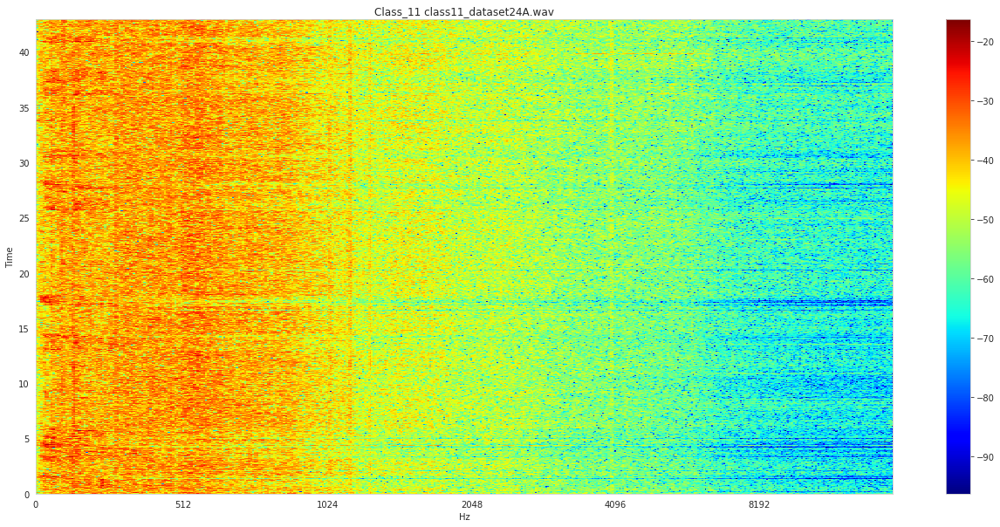

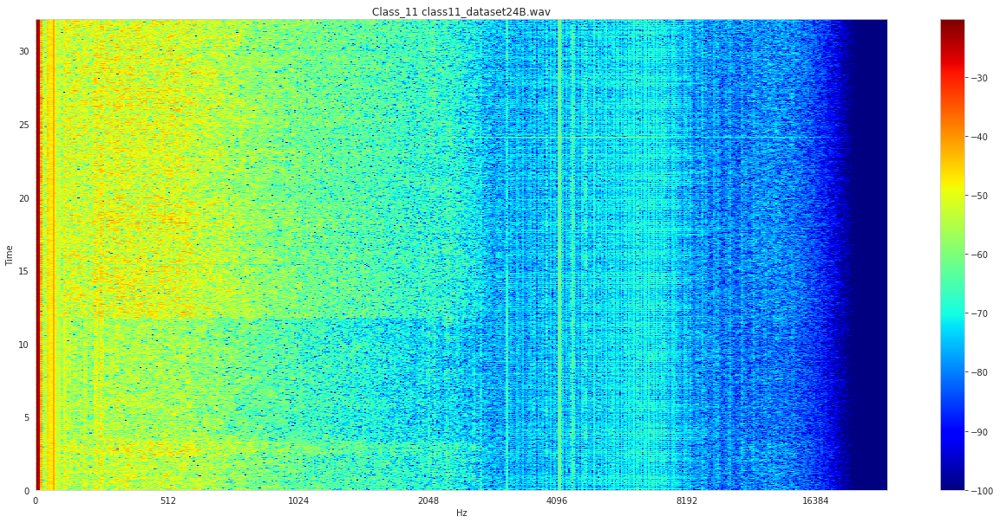

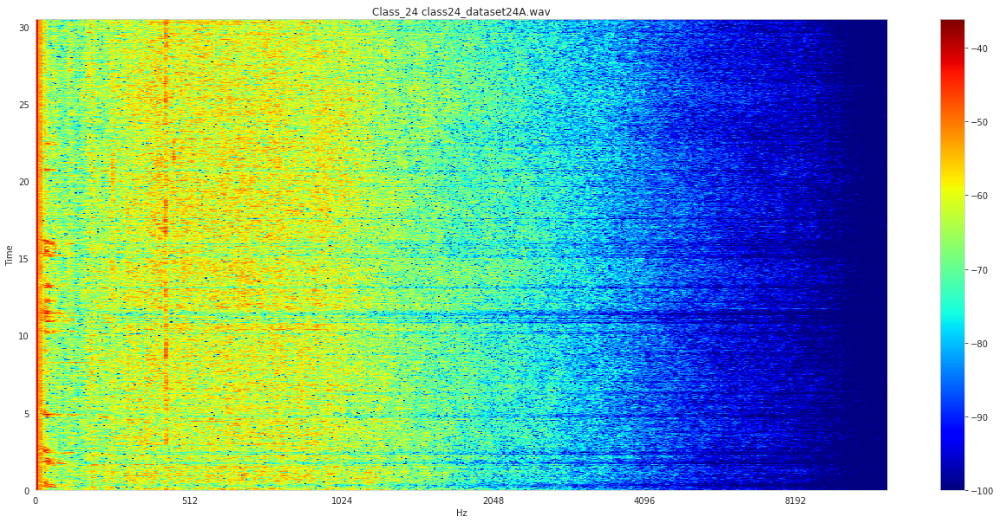

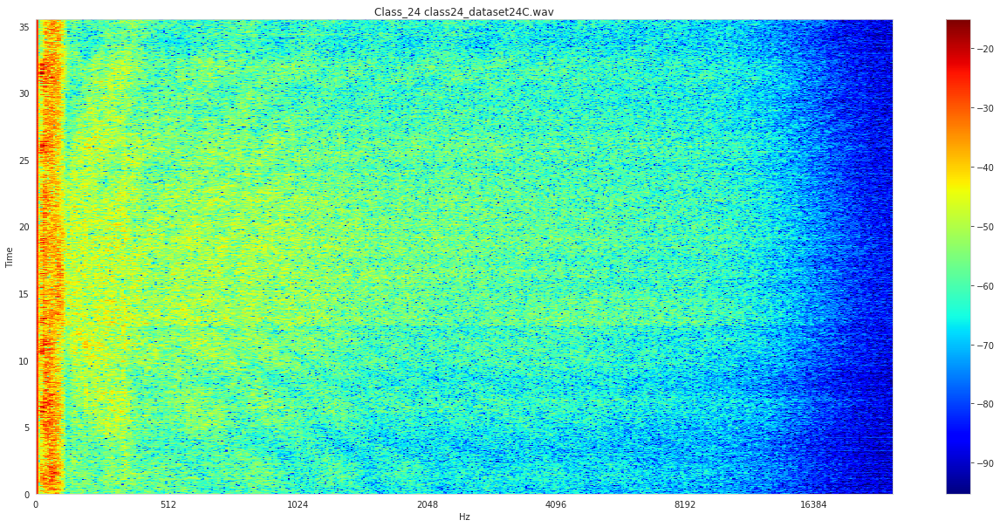

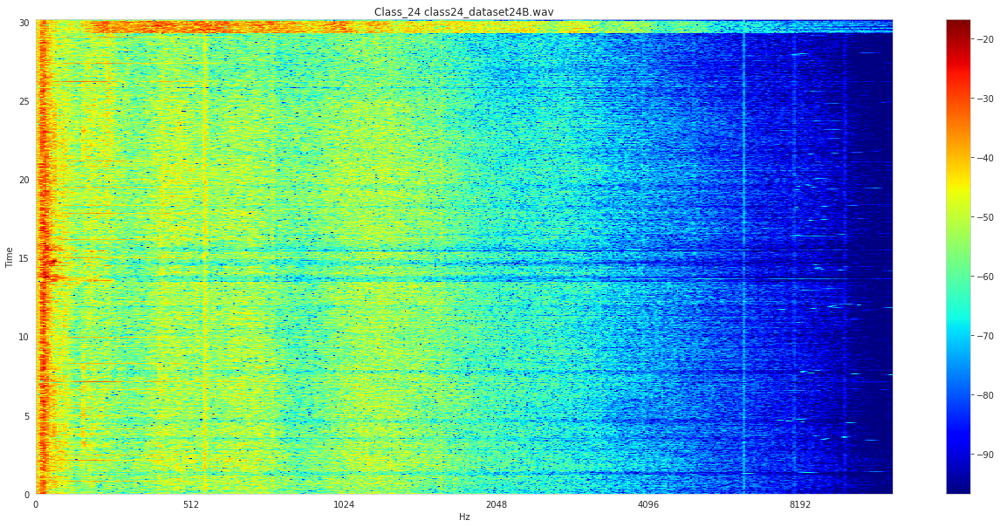

...

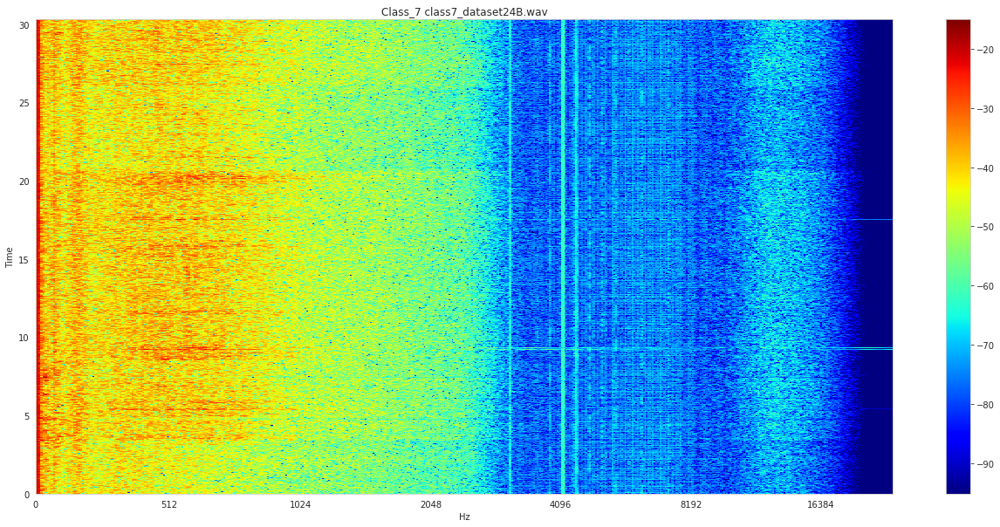

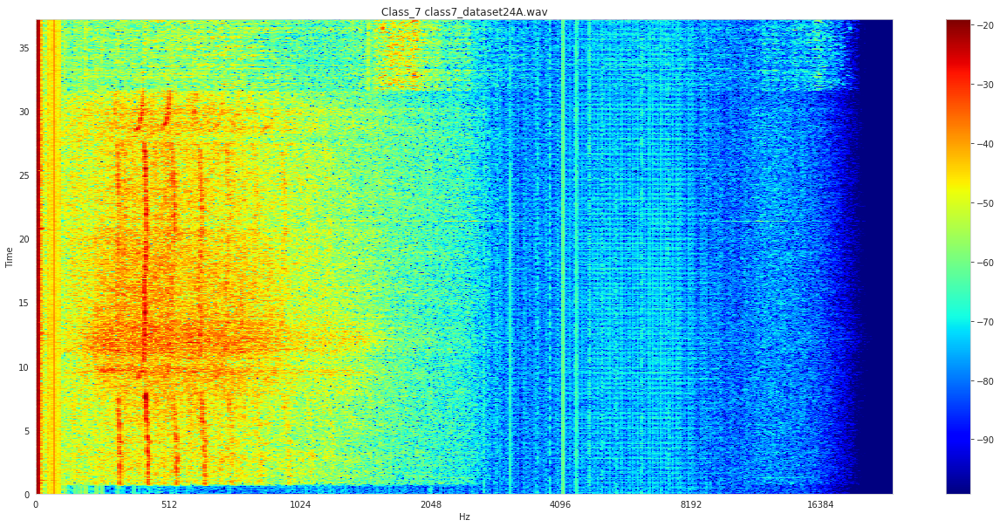

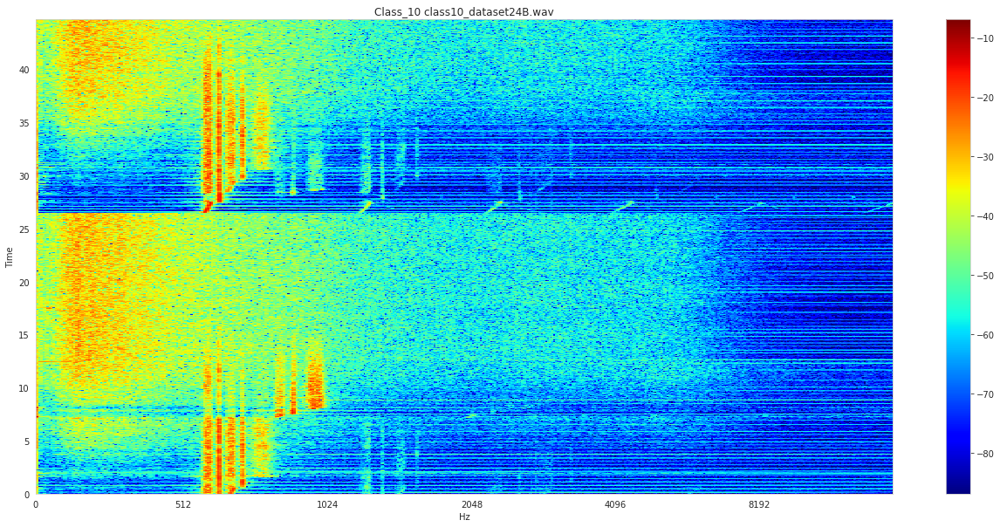

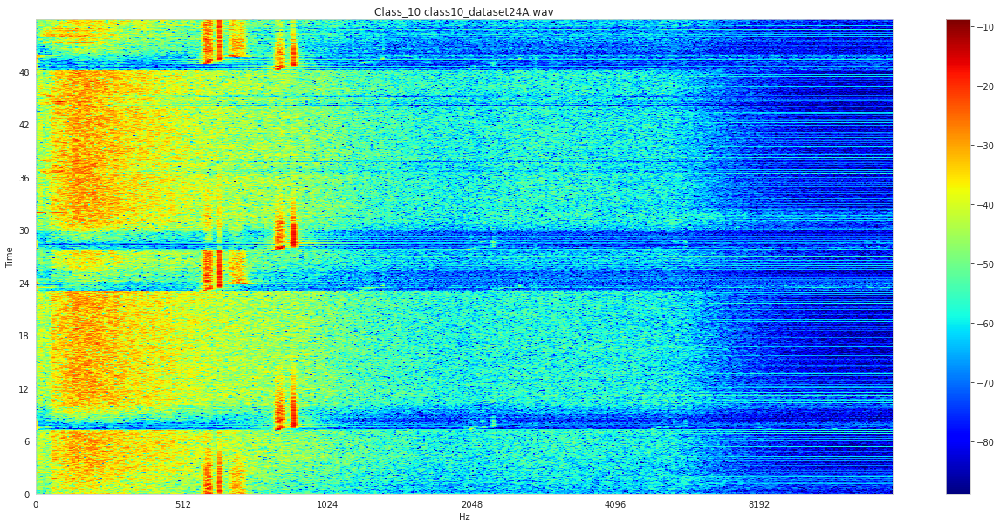

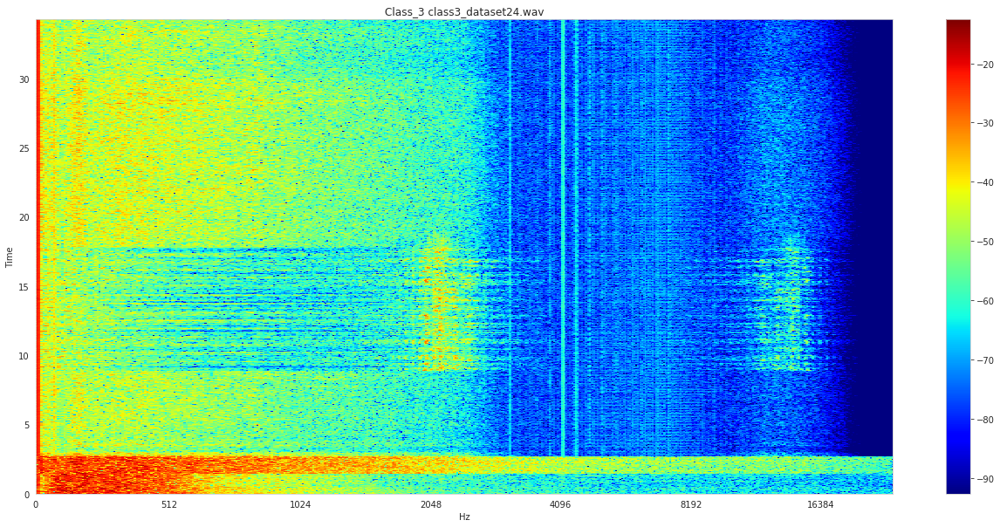

In [ ]:
def plt_lofar():
    plot_lofargram()  

def plot_energy_disp(x, freq, step=20, ax=None):
    energy = np.apply_along_axis(lambda x: np.cumsum(x)/x.sum(), axis=1, arr=x)
#     min_energy  = energy.min(axis=1), 
#     mean_energy = energy.mean(axis=1), 
#     max_energy  = energy.max(axis=1)
    df = pd.DataFrame(energy[:,::step], columns=freq[::step]).melt(value_name='energy', var_name='freq')
    ax = sns.boxplot(data=df, x='freq', y='energy', ax=ax, fliersize=0.4)
    plt.setp( ax.xaxis.get_majorticklabels(), rotation=70)
    
    
import librosa 
# sonar_dict.apply(lambda rr: plot_lofargram(rr[0], rr[1], rr[2]))
for cls_name, cls_data in sonar_dict.items():
    for run_name, rr in cls_data.items():
        sxx = librosa.power_to_db(rr[0]**2)
        fig, axes = plt.subplots(ncols=1, figsize=(22,10,))
        specshow(sxx, sr=rr[3], x_axis='mel',y_axis='time', cmap='jet', ax=axes, fig=fig, fmax=rr[1][-1])
#         specshow(sxx, x_axis='linear', cmap='jet', ax=axes[1], fig=fig, fmax=rr[1][-1])
#         plot_lofargram(sxx, rr[1], rr[2], ax=axes[0])
#         plot_energy_disp(sxx + 10e-09, rr[1], ax=axes[1])
        axes.set_title(cls_name + ' ' + run_name)
#         axes[1].set_title(cls_name + ' ' + run_name + ' Freq Linear Scale')
        
# rr = sonar_dict['Class_11']['class11_dataset24A.wav']
# plot_lofargram(rr[0], rr[1], rr[2])

In [18]:
import warnings
import six
import re
import numpy as np
from librosa import core
from matplotlib.cm import get_cmap
from matplotlib.axes import Axes
from matplotlib.ticker import Formatter, ScalarFormatter
from matplotlib.ticker import LogLocator, FixedLocator, MaxNLocator
from matplotlib.ticker import SymmetricalLogLocator


class TimeFormatter(Formatter):
    '''A tick formatter for time axes.

    Automatically switches between seconds, minutes:seconds,
    or hours:minutes:seconds.

    Parameters
    ----------
    lag : bool
        If `True`, then the time axis is interpreted in lag coordinates.
        Anything past the midpoint will be converted to negative time.

    unit : str or None
        Abbreviation of the physical unit for axis labels and ticks.
        Either equal to `s` (seconds) or `ms` (milliseconds) or None (default).
        If set to None, the resulting TimeFormatter object adapts its string
        representation to the duration of the underlying time range:
        `hh:mm:ss` above 3600 seconds; `mm:ss` between 60 and 3600 seconds;
        and `ss` below 60 seconds.


    See also
    --------
    matplotlib.ticker.Formatter


    Examples
    --------

    For normal time

    >>> import matplotlib.pyplot as plt
    >>> times = np.arange(30)
    >>> values = np.random.randn(len(times))
    >>> plt.figure()
    >>> ax = plt.gca()
    >>> ax.plot(times, values)
    >>> ax.xaxis.set_major_formatter(librosa.display.TimeFormatter())
    >>> ax.set_xlabel('Time')
    >>> plt.show()

    Manually set the physical time unit of the x-axis to milliseconds

    >>> times = np.arange(100)
    >>> values = np.random.randn(len(times))
    >>> plt.figure()
    >>> ax = plt.gca()
    >>> ax.plot(times, values)
    >>> ax.xaxis.set_major_formatter(librosa.display.TimeFormatter(unit='ms'))
    >>> ax.set_xlabel('Time (ms)')

    For lag plots

    >>> times = np.arange(60)
    >>> values = np.random.randn(len(times))
    >>> plt.figure()
    >>> ax = plt.gca()
    >>> ax.plot(times, values)
    >>> ax.xaxis.set_major_formatter(librosa.display.TimeFormatter(lag=True))
    >>> ax.set_xlabel('Lag')
    '''

    def __init__(self, lag=False, unit=None):

        if unit not in ['s', 'ms', None]:
            raise ParameterError('Unknown time unit: {}'.format(unit))

        self.unit = unit
        self.lag = lag


    def __call__(self, x, pos=None):
        '''Return the time format as pos'''

        _, dmax = self.axis.get_data_interval()
        vmin, vmax = self.axis.get_view_interval()

        # In lag-time axes, anything greater than dmax / 2 is negative time
        if self.lag and x >= dmax * 0.5:
            # In lag mode, don't tick past the limits of the data
            if x > dmax:
                return ''
            value = np.abs(x - dmax)
            # Do we need to tweak vmin/vmax here?
            sign = '-'
        else:
            value = x
            sign = ''

        if self.unit == 's':
            s = '{:.3g}'.format(value)
        elif self.unit == 'ms':
            s = '{:.3g}'.format(value * 1000)
        else:
            if vmax - vmin > 3600:
                s = '{:d}:{:02d}:{:02d}'.format(int(value / 3600.0),
                                                int(np.mod(value / 60.0, 60)),
                                                int(np.mod(value, 60)))
            elif vmax - vmin > 60:
                s = '{:d}:{:02d}'.format(int(value / 60.0),
                                         int(np.mod(value, 60)))
            else:
                s = '{:.2g}'.format(value)

        return '{:s}{:s}'.format(sign, s)



def mel_to_hz(mels, htk=False):
    """Convert mel bin numbers to frequencies

    Examples
    --------
    >>> librosa.mel_to_hz(3)
    200.

    >>> librosa.mel_to_hz([1,2,3,4,5])
    array([  66.667,  133.333,  200.   ,  266.667,  333.333])

    Parameters
    ----------
    mels          : np.ndarray [shape=(n,)], float
        mel bins to convert
    htk           : bool
        use HTK formula instead of Slaney

    Returns
    -------
    frequencies   : np.ndarray [shape=(n,)]
        input mels in Hz

    See Also
    --------
    hz_to_mel
    """

    mels = np.asanyarray(mels)

    if htk:
        return 700.0 * (10.0**(mels / 2595.0) - 1.0)

    # Fill in the linear scale
    f_min = 0.0
    f_sp = 200.0 / 3
    freqs = f_min + f_sp * mels

    # And now the nonlinear scale
    min_log_hz = 1000.0                         # beginning of log region (Hz)
    min_log_mel = (min_log_hz - f_min) / f_sp   # same (Mels)
    logstep = np.log(6.4) / 27.0                # step size for log region

    if mels.ndim:
        # If we have vector data, vectorize
        log_t = (mels >= min_log_mel)
        freqs[log_t] = min_log_hz * np.exp(logstep * (mels[log_t] - min_log_mel))
    elif mels >= min_log_mel:
        # If we have scalar data, check directly
        freqs = min_log_hz * np.exp(logstep * (mels - min_log_mel))

    return freqs

def hz_to_mel(frequencies, htk=False):
    """Convert Hz to Mels

    Examples
    --------
    >>> librosa.hz_to_mel(60)
    0.9
    >>> librosa.hz_to_mel([110, 220, 440])
    array([ 1.65,  3.3 ,  6.6 ])

    Parameters
    ----------
    frequencies   : number or np.ndarray [shape=(n,)] , float
        scalar or array of frequencies
    htk           : bool
        use HTK formula instead of Slaney

    Returns
    -------
    mels        : number or np.ndarray [shape=(n,)]
        input frequencies in Mels

    See Also
    --------
    mel_to_hz
    """

    frequencies = np.asanyarray(frequencies)

    if htk:
        return 2595.0 * np.log10(1.0 + frequencies / 700.0)

    # Fill in the linear part
    f_min = 0.0
    f_sp = 200.0 / 3

    mels = (frequencies - f_min) / f_sp

    # Fill in the log-scale part

    min_log_hz = 1000.0                         # beginning of log region (Hz)
    min_log_mel = (min_log_hz - f_min) / f_sp   # same (Mels)
    logstep = np.log(6.4) / 27.0                # step size for log region

    if frequencies.ndim:
        # If we have array data, vectorize
        log_t = (frequencies >= min_log_hz)
        mels[log_t] = min_log_mel + np.log(frequencies[log_t]/min_log_hz) / logstep
    elif frequencies >= min_log_hz:
        # If we have scalar data, heck directly
        mels = min_log_mel + np.log(frequencies / min_log_hz) / logstep

    return mels

def midi_to_hz(notes):
    """Get the frequency (Hz) of MIDI note(s)

    Examples
    --------
    >>> librosa.midi_to_hz(36)
    65.406

    >>> librosa.midi_to_hz(np.arange(36, 48))
    array([  65.406,   69.296,   73.416,   77.782,   82.407,
             87.307,   92.499,   97.999,  103.826,  110.   ,
            116.541,  123.471])

    Parameters
    ----------
    notes       : int or np.ndarray [shape=(n,), dtype=int]
        midi number(s) of the note(s)

    Returns
    -------
    frequency   : number or np.ndarray [shape=(n,), dtype=float]
        frequency (frequencies) of `notes` in Hz

    See Also
    --------
    hz_to_midi
    note_to_hz
    """

    return 440.0 * (2.0 ** ((np.asanyarray(notes) - 69.0)/12.0))


def note_to_midi(note, round_midi=True):
    '''Convert one or more spelled notes to MIDI number(s).

    Notes may be spelled out with optional accidentals or octave numbers.

    The leading note name is case-insensitive.

    Sharps are indicated with ``#``, flats may be indicated with ``!`` or ``b``.

    Parameters
    ----------
    note : str or iterable of str
        One or more note names.

    round_midi : bool
        - If `True`, allow for fractional midi notes
        - Otherwise, round cent deviations to the nearest note

    Returns
    -------
    midi : float or np.array
        Midi note numbers corresponding to inputs.

    Raises
    ------
    ParameterError
        If the input is not in valid note format

    See Also
    --------
    midi_to_note
    note_to_hz

    Examples
    --------
    >>> librosa.note_to_midi('C')
    12
    >>> librosa.note_to_midi('C#3')
    49
    >>> librosa.note_to_midi('f4')
    65
    >>> librosa.note_to_midi('Bb-1')
    10
    >>> librosa.note_to_midi('A!8')
    116
    >>> # Lists of notes also work
    >>> librosa.note_to_midi(['C', 'E', 'G'])
    array([12, 16, 19])

    '''

    if not isinstance(note, six.string_types):
        return np.array([note_to_midi(n, round_midi=round_midi) for n in note])

    pitch_map = {'C': 0, 'D': 2, 'E': 4, 'F': 5, 'G': 7, 'A': 9, 'B': 11}
    acc_map = {'#': 1, '': 0, 'b': -1, '!': -1}

    match = re.match(r'^(?P<note>[A-Ga-g])'
                     r'(?P<accidental>[#b!]*)'
                     r'(?P<octave>[+-]?\d+)?'
                     r'(?P<cents>[+-]\d+)?$',
                     note)
    if not match:
        raise ParameterError('Improper note format: {:s}'.format(note))

    pitch = match.group('note').upper()
    offset = np.sum([acc_map[o] for o in match.group('accidental')])
    octave = match.group('octave')
    cents = match.group('cents')

    if not octave:
        octave = 0
    else:
        octave = int(octave)

    if not cents:
        cents = 0
    else:
        cents = int(cents) * 1e-2

    note_value = 12 * (octave + 1) + pitch_map[pitch] + offset + cents

    if round_midi:
        note_value = int(np.round(note_value))

    return note_value




def note_to_hz(note, **kwargs):
    '''Convert one or more note names to frequency (Hz)

    Examples
    --------
    >>> # Get the frequency of a note
    >>> librosa.note_to_hz('C')
    array([ 16.352])
    >>> # Or multiple notes
    >>> librosa.note_to_hz(['A3', 'A4', 'A5'])
    array([ 220.,  440.,  880.])
    >>> # Or notes with tuning deviations
    >>> librosa.note_to_hz('C2-32', round_midi=False)
    array([ 64.209])

    Parameters
    ----------
    note : str or iterable of str
        One or more note names to convert

    kwargs : additional keyword arguments
        Additional parameters to `note_to_midi`

    Returns
    -------
    frequencies : number or np.ndarray [shape=(len(note),)]
        Array of frequencies (in Hz) corresponding to `note`

    See Also
    --------
    midi_to_hz
    note_to_midi
    hz_to_note
    '''
    return midi_to_hz(note_to_midi(note, **kwargs))

def __set_current_image(ax, img):
    '''Helper to set the current image in pyplot mode.

    If the provided `ax` is not `None`, then we assume that the user is using the object API.
    In this case, the pyplot current image is not set.
    '''

    if ax is None:
        import matplotlib.pyplot as plt
        plt.sci(img)
        
        

def specshow(data, x_coords=None, y_coords=None,
             x_axis=None, y_axis=None,
             sr=22050, hop_length=512,
             fmin=None, fmax=None,
             tuning=0.0,
             bins_per_octave=12,
             fig=None,
             ax=None,
             **kwargs):
    '''Display a spectrogram/chromagram/cqt/etc.


    '''

    if np.issubdtype(data.dtype, np.complexfloating):
        warnings.warn('Trying to display complex-valued input. '
                      'Showing magnitude instead.')
        data = np.abs(data)

    kwargs.setdefault('cmap', cmap(data))
    kwargs.setdefault('rasterized', True)
    kwargs.setdefault('edgecolors', 'None')
    kwargs.setdefault('shading', 'flat')

    all_params = dict(kwargs=kwargs,
                      sr=sr,
                      fmin=fmin,
                      fmax=fmax,
                      tuning=tuning,
                      bins_per_octave=bins_per_octave,
                      hop_length=hop_length)

    # Get the x and y coordinates
    y_coords = __mesh_coords(y_axis, y_coords, data.shape[0], **all_params)
    x_coords = __mesh_coords(x_axis, x_coords, data.shape[1], **all_params)

    axes = __check_axes(ax)
    out = axes.pcolormesh(x_coords, y_coords, data, **kwargs)
    __set_current_image(ax, out)
    fig.colorbar(out)

    axes.set_xlim(x_coords.min(), x_coords.max())
    axes.set_ylim(y_coords.min(), y_coords.max())

    # Set up axis scaling
    __scale_axes(axes, x_axis, 'x')
    __scale_axes(axes, y_axis, 'y')

    # Construct tickers and locators
    __decorate_axis(axes.xaxis, x_axis)
    __decorate_axis(axes.yaxis, y_axis)

    return axes

def cmap(data, robust=True, cmap_seq='magma', cmap_bool='gray_r', cmap_div='coolwarm'):
    '''Get a default colormap from the given data.

    If the data is boolean, use a black and white colormap.

    If the data has both positive and negative values,
    use a diverging colormap.

    Otherwise, use a sequential colormap.

    Parameters
    ----------
    data : np.ndarray
        Input data

    robust : bool
        If True, discard the top and bottom 2% of data when calculating
        range.

    cmap_seq : str
        The sequential colormap name

    cmap_bool : str
        The boolean colormap name

    cmap_div : str
        The diverging colormap name

    Returns
    -------
    cmap : matplotlib.colors.Colormap
        The colormap to use for `data`

    See Also
    --------
    matplotlib.pyplot.colormaps
    '''

    data = np.atleast_1d(data)

    if data.dtype == 'bool':
        return get_cmap(cmap_bool)

    data = data[np.isfinite(data)]

    if robust:
        min_p, max_p = 2, 98
    else:
        min_p, max_p = 0, 100

    max_val = np.percentile(data, max_p)
    min_val = np.percentile(data, min_p)

    if min_val >= 0 or max_val <= 0:
        return get_cmap(cmap_seq)

    return get_cmap(cmap_div)



def __envelope(x, hop):
    '''Compute the max-envelope of non-overlapping frames of x at length hop

    x is assumed to be multi-channel, of shape (n_channels, n_samples).
    '''
    x_frame = np.abs(util.frame(x, frame_length=hop, hop_length=hop))
    return x_frame.max(axis=1)


def __mesh_coords(ax_type, coords, n, **kwargs):
    '''Compute axis coordinates'''

    if coords is not None:
        if len(coords) < n:
            raise ParameterError('Coordinate shape mismatch: '
                                 '{}<{}'.format(len(coords), n))
        return coords

    coord_map = {'linear': __coord_fft_hz,
                 'hz': __coord_fft_hz,
                 'log': __coord_fft_hz,
                 'mel': __coord_mel_hz,
                 'cqt': __coord_cqt_hz,
                 'cqt_hz': __coord_cqt_hz,
                 'cqt_note': __coord_cqt_hz,
                 'chroma': __coord_chroma,
                 'time': __coord_time,
                 's': __coord_time,
                 'ms': __coord_time,
                 'lag': __coord_time,
                 'lag_s': __coord_time,
                 'lag_ms': __coord_time,
                 'tonnetz': __coord_n,
                 'off': __coord_n,
                 'tempo': __coord_tempo,
                 'fourier_tempo': __coord_fourier_tempo,
                 'frames': __coord_n,
                 None: __coord_n}

    if ax_type not in coord_map:
        raise ParameterError('Unknown axis type: {}'.format(ax_type))
    return coord_map[ax_type](n, **kwargs)


def __check_axes(axes):
    '''Check if "axes" is an instance of an axis object. If not, use `gca`.'''
    if axes is None:
        import matplotlib.pyplot as plt
        axes = plt.gca()
    elif not isinstance(axes, Axes):
        raise ValueError("`axes` must be an instance of matplotlib.axes.Axes. "
                         "Found type(axes)={}".format(type(axes)))
    return axes


def __scale_axes(axes, ax_type, which):
    '''Set the axis scaling'''

    kwargs = dict()
    if which == 'x':
        thresh = 'linthreshx'
        base = 'basex'
        scale = 'linscalex'
        scaler = axes.set_xscale
        limit = axes.set_xlim
    else:
        thresh = 'linthreshy'
        base = 'basey'
        scale = 'linscaley'
        scaler = axes.set_yscale
        limit = axes.set_ylim

    # Map ticker scales
    if ax_type == 'mel':
        mode = 'symlog'
        kwargs[thresh] = 1000.0
        kwargs[base] = 2

    elif ax_type == 'log':
        mode = 'symlog'
        kwargs[base] = 2
        kwargs[thresh] = note_to_hz('C2')
        kwargs[scale] = 0.5

    elif ax_type in ['cqt', 'cqt_hz', 'cqt_note']:
        mode = 'log'
        kwargs[base] = 2

    elif ax_type in ['tempo', 'fourier_tempo']:
        mode = 'log'
        kwargs[base] = 2
        limit(16, 480)
    else:
        return

    scaler(mode, **kwargs)


def __decorate_axis(axis, ax_type):
    '''Configure axis tickers, locators, and labels'''

    if ax_type == 'tonnetz':
        axis.set_major_formatter(TonnetzFormatter())
        axis.set_major_locator(FixedLocator(0.5 + np.arange(6)))
        axis.set_label_text('Tonnetz')

    elif ax_type == 'chroma':
        axis.set_major_formatter(ChromaFormatter())
        axis.set_major_locator(FixedLocator(0.5 +
                                            np.add.outer(12 * np.arange(10),
                                                         [0, 2, 4, 5, 7, 9, 11]).ravel()))
        axis.set_label_text('Pitch class')

    elif ax_type in ['tempo', 'fourier_tempo']:
        axis.set_major_formatter(ScalarFormatter())
        axis.set_major_locator(LogLocator(base=2.0))
        axis.set_label_text('BPM')

    elif ax_type == 'time':
        axis.set_major_formatter(TimeFormatter(unit=None, lag=False))
        axis.set_major_locator(MaxNLocator(prune=None,
                                           steps=[1, 1.5, 5, 6, 10]))
        axis.set_label_text('Time')

    elif ax_type == 's':
        axis.set_major_formatter(TimeFormatter(unit='s', lag=False))
        axis.set_major_locator(MaxNLocator(prune=None,
                                           steps=[1, 1.5, 5, 6, 10]))
        axis.set_label_text('Time (s)')

    elif ax_type == 'ms':
        axis.set_major_formatter(TimeFormatter(unit='ms', lag=False))
        axis.set_major_locator(MaxNLocator(prune=None,
                                           steps=[1, 1.5, 5, 6, 10]))
        axis.set_label_text('Time (ms)')

    elif ax_type == 'lag':
        axis.set_major_formatter(TimeFormatter(unit=None, lag=True))
        axis.set_major_locator(MaxNLocator(prune=None,
                                           steps=[1, 1.5, 5, 6, 10]))
        axis.set_label_text('Lag')

    elif ax_type == 'lag_s':
        axis.set_major_formatter(TimeFormatter(unit='s', lag=True))
        axis.set_major_locator(MaxNLocator(prune=None,
                                           steps=[1, 1.5, 5, 6, 10]))
        axis.set_label_text('Lag (s)')

    elif ax_type == 'lag_ms':
        axis.set_major_formatter(TimeFormatter(unit='ms', lag=True))
        axis.set_major_locator(MaxNLocator(prune=None,
                                           steps=[1, 1.5, 5, 6, 10]))
        axis.set_label_text('Lag (ms)')

    elif ax_type == 'cqt_note':
        axis.set_major_formatter(NoteFormatter())
        axis.set_major_locator(LogLocator(base=2.0))
        axis.set_minor_formatter(NoteFormatter(major=False))
        axis.set_minor_locator(LogLocator(base=2.0,
                                          subs=2.0**(np.arange(1, 12)/12.0)))
        axis.set_label_text('Note')

    elif ax_type in ['cqt_hz']:
        axis.set_major_formatter(LogHzFormatter())
        axis.set_major_locator(LogLocator(base=2.0))
        axis.set_minor_formatter(LogHzFormatter(major=False))
        axis.set_minor_locator(LogLocator(base=2.0,
                                          subs=2.0**(np.arange(1, 12)/12.0)))
        axis.set_label_text('Hz')

    elif ax_type in ['mel', 'log']:
        axis.set_major_formatter(ScalarFormatter())
        axis.set_major_locator(SymmetricalLogLocator(axis.get_transform()))
        axis.set_label_text('Hz')

    elif ax_type in ['linear', 'hz']:
        axis.set_major_formatter(ScalarFormatter())
        axis.set_label_text('Hz')

    elif ax_type in ['frames']:
        axis.set_label_text('Frames')

    elif ax_type in ['off', 'none', None]:
        axis.set_label_text('')
        axis.set_ticks([])


def __coord_fft_hz(n, sr=22050, **_kwargs):
    '''Get the frequencies for FFT bins'''
    n_fft = 2 * (n - 1)
    # The following code centers the FFT bins at their frequencies
    # and clips to the non-negative frequency range [0, nyquist]
    basis = fft_frequencies(sr=sr, n_fft=n_fft)
    fmax = basis[-1]
    basis -= 0.5 * (basis[1] - basis[0])
    basis = np.append(np.maximum(0, basis), [fmax])
    return basis

def fft_frequencies(sr=22050, n_fft=2048):
    '''Alternative implementation of `np.fft.fftfreq`

    Parameters
    ----------
    sr : number > 0 [scalar]
        Audio sampling rate

    n_fft : int > 0 [scalar]
        FFT window size


    Returns
    -------
    freqs : np.ndarray [shape=(1 + n_fft/2,)]
        Frequencies `(0, sr/n_fft, 2*sr/n_fft, ..., sr/2)`


    Examples
    --------
    >>> librosa.fft_frequencies(sr=22050, n_fft=16)
    array([     0.   ,   1378.125,   2756.25 ,   4134.375,
             5512.5  ,   6890.625,   8268.75 ,   9646.875,  11025.   ])

    '''

    return np.linspace(0,
                       float(sr) / 2,
                       int(1 + n_fft//2),
                       endpoint=True)




def mel_frequencies(n_mels=128, fmin=0.0, fmax=11025.0, htk=False):
    """Compute an array of acoustic frequencies tuned to the mel scale.

    The mel scale is a quasi-logarithmic function of acoustic frequency
    designed such that perceptually similar pitch intervals (e.g. octaves)
    appear equal in width over the full hearing range.

    Because the definition of the mel scale is conditioned by a finite number
    of subjective psychoaoustical experiments, several implementations coexist
    in the audio signal processing literature [1]_. By default, librosa replicates
    the behavior of the well-established MATLAB Auditory Toolbox of Slaney [2]_.
    According to this default implementation,  the conversion from Hertz to mel is
    linear below 1 kHz and logarithmic above 1 kHz. Another available implementation
    replicates the Hidden Markov Toolkit [3]_ (HTK) according to the following formula:

    `mel = 2595.0 * np.log10(1.0 + f / 700.0).`

    The choice of implementation is determined by the `htk` keyword argument: setting
    `htk=False` leads to the Auditory toolbox implementation, whereas setting it `htk=True`
    leads to the HTK implementation.

    .. [1] Umesh, S., Cohen, L., & Nelson, D. Fitting the mel scale.
        In Proc. International Conference on Acoustics, Speech, and Signal Processing
        (ICASSP), vol. 1, pp. 217-220, 1998.

    .. [2] Slaney, M. Auditory Toolbox: A MATLAB Toolbox for Auditory
        Modeling Work. Technical Report, version 2, Interval Research Corporation, 1998.

    .. [3] Young, S., Evermann, G., Gales, M., Hain, T., Kershaw, D., Liu, X.,
        Moore, G., Odell, J., Ollason, D., Povey, D., Valtchev, V., & Woodland, P.
        The HTK book, version 3.4. Cambridge University, March 2009.


    See Also
    --------
    hz_to_mel
    mel_to_hz
    librosa.feature.melspectrogram
    librosa.feature.mfcc


    Parameters
    ----------
    n_mels    : int > 0 [scalar]
        Number of mel bins.

    fmin      : float >= 0 [scalar]
        Minimum frequency (Hz).

    fmax      : float >= 0 [scalar]
        Maximum frequency (Hz).

    htk       : bool
        If True, use HTK formula to convert Hz to mel.
        Otherwise (False), use Slaney's Auditory Toolbox.

    Returns
    -------
    bin_frequencies : ndarray [shape=(n_mels,)]
        Vector of n_mels frequencies in Hz which are uniformly spaced on the Mel
        axis.

    Examples
    --------
    >>> librosa.mel_frequencies(n_mels=40)
    array([     0.   ,     85.317,    170.635,    255.952,
              341.269,    426.586,    511.904,    597.221,
              682.538,    767.855,    853.173,    938.49 ,
             1024.856,   1119.114,   1222.042,   1334.436,
             1457.167,   1591.187,   1737.532,   1897.337,
             2071.84 ,   2262.393,   2470.47 ,   2697.686,
             2945.799,   3216.731,   3512.582,   3835.643,
             4188.417,   4573.636,   4994.285,   5453.621,
             5955.205,   6502.92 ,   7101.009,   7754.107,
             8467.272,   9246.028,  10096.408,  11025.   ])

    """

    # 'Center freqs' of mel bands - uniformly spaced between limits
    min_mel = hz_to_mel(fmin, htk=htk)
    max_mel = hz_to_mel(fmax, htk=htk)

    mels = np.linspace(min_mel, max_mel, n_mels)

    return mel_to_hz(mels, htk=htk)

def __coord_mel_hz(n, fmin=0, fmax=11025.0, **_kwargs):
    '''Get the frequencies for Mel bins'''

    if fmin is None:
        fmin = 0
    if fmax is None:
        fmax = 11025.0

    basis = mel_frequencies(n, fmin=fmin, fmax=fmax)
    basis[1:] -= 0.5 * np.diff(basis)
    basis = np.append(np.maximum(0, basis), [fmax])
    return basis


def __coord_cqt_hz(n, fmin=None, bins_per_octave=12, **_kwargs):
    '''Get CQT bin frequencies'''
    if fmin is None:
        fmin = note_to_hz('C1')

    # Apply tuning correction
    fmin = fmin * 2.0**(_kwargs.get('tuning', 0.0) / bins_per_octave)

    # we drop by half a bin so that CQT bins are centered vertically
    return core.cqt_frequencies(n+1,
                                fmin=fmin / 2.0**(0.5/bins_per_octave),
                                bins_per_octave=bins_per_octave)


def __coord_chroma(n, bins_per_octave=12, **_kwargs):
    '''Get chroma bin numbers'''
    return np.linspace(0, (12.0 * n) / bins_per_octave, num=n+1, endpoint=True)


def __coord_tempo(n, sr=22050, hop_length=512, **_kwargs):
    '''Tempo coordinates'''
    basis = core.tempo_frequencies(n+2, sr=sr, hop_length=hop_length)[1:]
    edges = np.arange(1, n+2)
    return basis * (edges + 0.5) / edges


def __coord_fourier_tempo(n, sr=22050, hop_length=512, **_kwargs):
    '''Fourier tempogram coordinates'''

    n_fft = 2 * (n - 1)
    # The following code centers the FFT bins at their frequencies
    # and clips to the non-negative frequency range [0, nyquist]
    basis = core.fourier_tempo_frequencies(sr=sr,
                                           hop_length=hop_length,
                                           win_length=n_fft)
    fmax = basis[-1]
    basis -= 0.5 * (basis[1] - basis[0])
    basis = np.append(np.maximum(0, basis), [fmax])
    return basis


def __coord_n(n, **_kwargs):
    '''Get bare positions'''
    return np.arange(n+1)


def __coord_time(n, sr=22050, hop_length=512, **_kwargs):
    '''Get time coordinates from frames'''
    return core.frames_to_time(np.arange(n+1), sr=sr, hop_length=hop_length)